In [1]:
!pip install commonroad-all

  Using cached commonroad_all-0.0.2-py3-none-any.whl.metadata (1.6 kB)
  Using cached commonroad_io-2022.3-py3-none-any.whl.metadata (10 kB)
  Using cached commonroad-drivability-checker-2022.2.1.tar.gz (10.3 MB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
  Using cached commonroad_route_planner-2022.3-py3-none-any.whl.metadata (2.0 kB)
  Using cached sumocr-2022.4-py3-none-any.whl.metadata (2.7 kB)
  Using cached commonroad_rl-2023.1.3-py3-none-any.whl.metadata (9.3 kB)
  Using cached Polygon3-3.0.9.1.tar.gz (39 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: fin

ERROR: Could not install packages due to an OSError: [WinError 123] The filename, directory name, or volume label syntax is incorrect: 'C:\\Users\\saama\\AppData\\Local\\Temp\\pip-install-3z29c12h\\commonroad-drivability-checker_d460c207f8d2455ab9d039e3d1902448\\tests\\not_for_public_repo\\costs\\ressources\\example_solutions\\all\\KS2:SM2:PRI_Barceloneta-3_1_T-1:2020a\\d2ef693a-b5d0-4a4f-a541-aa9573a73305.xml'
HINT: This error might have occurred since this system does not have Windows Long Path support enabled. You can find information on how to enable this at https://pip.pypa.io/warnings/enable-long-paths



# CommonRoad merge notebook

Use the repo **uv** env: run `uv sync`, then select interpreter **`.venv`** or kernel **CommonRoad (.venv)** — not `!pip` in the notebook.

**Visualise:** run the load cell, then the plotting cell (static map + obstacles + planning problem). Optional cell animates over time in the notebook.

In [3]:
from pathlib import Path

from commonroad.common.file_reader import CommonRoadFileReader

scenario_path = Path("outputs/scenarios/ZAM_Merge-1_1_I-1-1.xml")
if not scenario_path.is_file():
    raise FileNotFoundError(
        f"Missing {scenario_path}. Run: uv run python download_commonroad_scenarios.py"
    )

reader = CommonRoadFileReader(str(scenario_path))
scenario, planning_problem_set = reader.open()

print("Obstacles:", len(scenario.obstacles))
print("Planning problems:", len(planning_problem_set.planning_problem_dict))
print("Scenario dt:", scenario.dt)

Obstacles: 2
Planning problems: 1
Scenario dt: 0.1


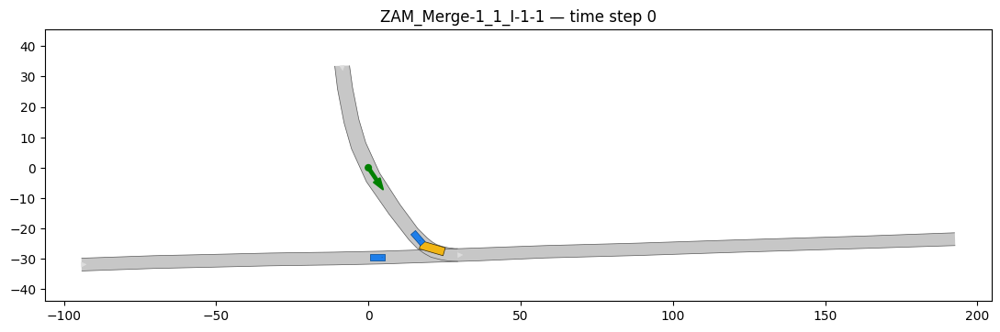

In [4]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
from commonroad.visualization.draw_params import MPDrawParams
from commonroad.visualization.mp_renderer import MPRenderer


def plot_limits_from_lanelets(lanelet_network, margin: float = 12.0) -> list[float]:
    xs, ys = [], []
    for ll in lanelet_network.lanelets:
        c = np.asarray(ll.center_vertices)
        xs.extend(c[:, 0].tolist())
        ys.extend(c[:, 1].tolist())
    return [
        float(min(xs) - margin),
        float(max(xs) + margin),
        float(min(ys) - margin),
        float(max(ys) + margin),
    ]


def draw_at_time_step(time_step: int) -> None:
    fig, ax = plt.subplots(figsize=(11, 6))
    limits = plot_limits_from_lanelets(scenario.lanelet_network)
    renderer = MPRenderer(plot_limits=limits, ax=ax)
    params = MPDrawParams()
    params.time_begin = time_step
    scenario.draw(renderer, draw_params=params)
    planning_problem_set.draw(renderer, draw_params=params)
    renderer.render()
    ax.set_aspect("equal")
    ax.set_title(f"{scenario.scenario_id} — time step {time_step}")
    plt.tight_layout()
    plt.show()


draw_at_time_step(0)

### Optional: animation in the notebook

Runs one matplotlib animation and shows it with the browser viewer (`to_jshtml()`). Can be slow for long horizons.

In [5]:
from IPython.display import HTML
from matplotlib import animation


def _max_time_step(sc) -> int:
    m = 0
    for obs in sc.dynamic_obstacles:
        m = max(m, obs.initial_state.time_step)
        for st in obs.prediction.trajectory.state_list:
            m = max(m, st.time_step)
    return max(m, 1)


t_end = min(120, _max_time_step(scenario))
frames = list(range(0, t_end + 1, max(1, (t_end + 1) // 50)))
if frames[-1] != t_end:
    frames.append(t_end)

fig, ax = plt.subplots(figsize=(11, 6))
limits = plot_limits_from_lanelets(scenario.lanelet_network)


def _frame(t: int):
    ax.clear()
    renderer = MPRenderer(plot_limits=limits, ax=ax)
    params = MPDrawParams()
    params.time_begin = t
    scenario.draw(renderer, draw_params=params)
    planning_problem_set.draw(renderer, draw_params=params)
    renderer.render()
    ax.set_aspect("equal")
    ax.set_title(f"{scenario.scenario_id} — step {t}")


anim = animation.FuncAnimation(fig, _frame, frames=frames, interval=120)
plt.close(fig)
HTML(anim.to_jshtml())

## Synthetic merge: two ramp curvatures (IDM simulation)

The **ZAM** XML above is a **fixed** benchmark map — you do not change its curvature there.

To **simulate** merges where geometry changes, use this repo’s **`merge_scenario.build_scenario(curvature=…)`**: the on-ramp is a cubic Bezier; **`curvature`** runs from **~0 (straighter / more abrupt diagonal)** to **~1 (smoother S-curve)**. Traffic is produced by the **IDM** simulator (`idm.py`), not hand-written trajectories.

For many κ values and safety plots, run from the repo root: `uv run python curvature_sweep.py`.

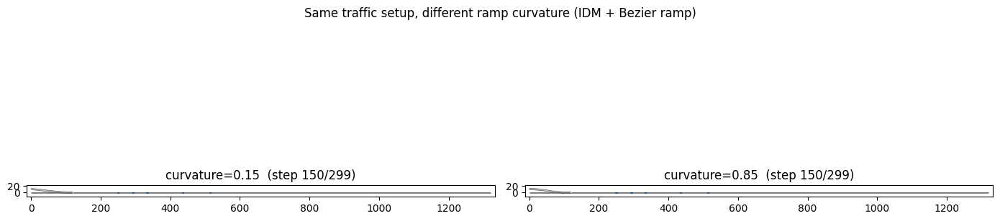

In [9]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

from commonroad.visualization.draw_params import MPDrawParams
from commonroad.visualization.mp_renderer import MPRenderer

from merge_scenario import STEPS, build_scenario


def _plot_limits(lanelet_network, margin: float = 12.0) -> list[float]:
    xs, ys = [], []
    for ll in lanelet_network.lanelets:
        c = np.asarray(ll.center_vertices)
        xs.extend(c[:, 0].tolist())
        ys.extend(c[:, 1].tolist())
    return [
        float(min(xs) - margin),
        float(max(xs) + margin),
        float(min(ys) - margin),
        float(max(ys) + margin),
    ]


def _draw_scenario_on_ax(scenario, ax, *, curvature: float, time_step: int) -> None:
    limits = _plot_limits(scenario.lanelet_network)
    renderer = MPRenderer(plot_limits=limits, ax=ax)
    params = MPDrawParams()
    params.time_begin = max(0, min(time_step, STEPS - 1))
    scenario.draw(renderer, draw_params=params)
    renderer.render()
    ax.set_aspect("equal")
    ax.set_title(f"curvature={curvature:.2f}  (step {params.time_begin}/{STEPS - 1})")


# Two merge “types”: low κ ≈ sharper diagonal, high κ ≈ gentler S-curve (see merge_scenario.bezier_merge_centerline)
kappa_a, kappa_b = 0.15, 0.85
t_view = min(150, STEPS - 1)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sc_a = build_scenario(merge_length=120.0, curvature=kappa_a, n_main_vehicles=3, n_ramp_vehicles=2)
_draw_scenario_on_ax(sc_a, axes[0], curvature=kappa_a, time_step=t_view)

sc_b = build_scenario(merge_length=120.0, curvature=kappa_b, n_main_vehicles=3, n_ramp_vehicles=2)
_draw_scenario_on_ax(sc_b, axes[1], curvature=kappa_b, time_step=t_view)

plt.suptitle("Same traffic setup, different ramp curvature (IDM + Bezier ramp)")
plt.tight_layout()
plt.show()

### Trajectories + side-by-side animation (both curvatures)

The next cell **plots** full vehicle paths (same κ as above) and builds an **HTML animation**: two panels advance in lockstep, with **trails** behind each car.

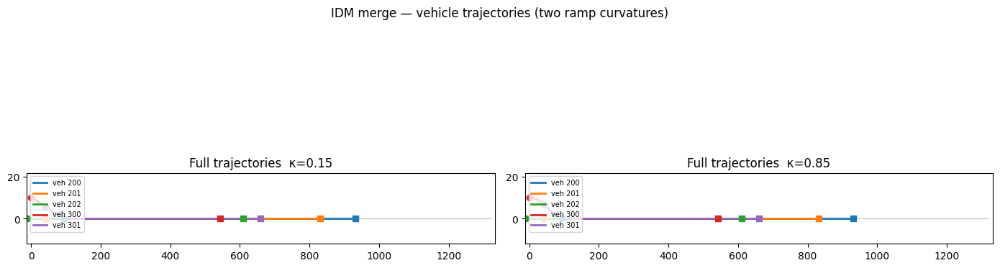

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML, display
from matplotlib import animation

from commonroad.visualization.draw_params import MPDrawParams
from commonroad.visualization.mp_renderer import MPRenderer
from merge_scenario import DT, STEPS, build_scenario

# Highway scenes span much more x than y; aspect="equal" squashes y to a hairline.
# >1.0 exaggerates vertical scale on screen (not physical 1:1 map units).
VERTICAL_SCALE = 6.0


def _plot_limits(lanelet_network, margin: float = 12.0) -> list[float]:
    xs, ys = [], []
    for ll in lanelet_network.lanelets:
        c = np.asarray(ll.center_vertices)
        xs.extend(c[:, 0].tolist())
        ys.extend(c[:, 1].tolist())
    return [
        float(min(xs) - margin),
        float(max(xs) + margin),
        float(min(ys) - margin),
        float(max(ys) + margin),
    ]


# Match the previous cell (change here to experiment)
kappa_a, kappa_b = 0.15, 0.85

sc_a = build_scenario(merge_length=120.0, curvature=kappa_a, n_main_vehicles=3, n_ramp_vehicles=2)
sc_b = build_scenario(merge_length=120.0, curvature=kappa_b, n_main_vehicles=3, n_ramp_vehicles=2)


def _positions_up_to(obs, t_max: int):
    xs, ys = [], []
    if obs.initial_state.time_step <= t_max:
        p = obs.initial_state.position
        xs.append(float(p[0]))
        ys.append(float(p[1]))
    for st in obs.prediction.trajectory.state_list:
        if st.time_step <= t_max:
            p = st.position
            xs.append(float(p[0]))
            ys.append(float(p[1]))
    return xs, ys


def _plot_full_trajectories(fig, axes, scenarios, kappas):
    cmap = plt.cm.tab10.colors
    for ax, sc, kap in zip(axes, scenarios, kappas):
        for ll in sc.lanelet_network.lanelets:
            c = np.asarray(ll.center_vertices)
            ax.plot(c[:, 0], c[:, 1], color="0.75", lw=0.9, zorder=0)
        for j, obs in enumerate(sc.dynamic_obstacles):
            xs, ys = _positions_up_to(obs, STEPS - 1)
            if len(xs) >= 2:
                ax.plot(
                    xs,
                    ys,
                    "-",
                    color=cmap[j % len(cmap)],
                    lw=2.0,
                    label=f"veh {obs.obstacle_id}",
                    zorder=1,
                )
            if xs:
                ax.scatter(xs[0], ys[0], s=36, c=[cmap[j % len(cmap)]], marker="o", zorder=2)
                ax.scatter(xs[-1], ys[-1], s=40, c=[cmap[j % len(cmap)]], marker="s", zorder=2)
        lims = _plot_limits(sc.lanelet_network)
        ax.set_xlim(lims[0], lims[1])
        ax.set_ylim(lims[2], lims[3])
        ax.set_aspect(VERTICAL_SCALE, adjustable="box")
        ax.set_title(f"Full trajectories  κ={kap:.2f}")
        ax.legend(loc="upper left", fontsize=7)


# --- Static: full paths over lane centerlines ---
fig_static, axes_s = plt.subplots(1, 2, figsize=(14, 5.5))
_plot_full_trajectories(fig_static, axes_s, (sc_a, sc_b), (kappa_a, kappa_b))
fig_static.suptitle("IDM merge — vehicle trajectories (two ramp curvatures)")
plt.tight_layout()
plt.show()




In [ ]:
# --- Animation: both panels + trails ---
limits_a = _plot_limits(sc_a.lanelet_network)
limits_b = _plot_limits(sc_b.lanelet_network)

#reduce horizontal limit
limits_a[1] = 400
limits_b[1] = 400

frame_step = max(1, STEPS // 90)
anim_frames = list(range(0, STEPS, frame_step))
if anim_frames[-1] != STEPS - 1:
    anim_frames.append(STEPS - 1)

fig_a, axes_a = plt.subplots(2, 1, figsize=(18, 10))
cmap = plt.cm.tab10.colors


def _draw_dual_frame(ti: int):
    for ax, sc, lims, kap in (
        (axes_a[0], sc_a, limits_a, kappa_a),
        (axes_a[1], sc_b, limits_b, kappa_b),
    ):
        ax.clear()
        for j, obs in enumerate(sc.dynamic_obstacles):
            xs, ys = _positions_up_to(obs, ti)
            if len(xs) >= 2:
                ax.plot(
                    xs,
                    ys,
                    "-",
                    color=cmap[j % len(cmap)],
                    lw=2.2,
                    alpha=0.85,
                    zorder=2,
                )
        renderer = MPRenderer(plot_limits=lims, ax=ax)
        params = MPDrawParams()
        params.time_begin = ti
        sc.draw(renderer, draw_params=params)
        renderer.render()
        ax.set_title(f"κ={kap:.2f}   t={ti * DT:.1f}s  (step {ti})")
        ax.set_aspect("auto")


anim = animation.FuncAnimation(
    fig_a, _draw_dual_frame, frames=anim_frames, interval=max(60, int(100 * frame_step / 2))
)
plt.close(fig_a)
display(HTML(anim.to_jshtml()))

: 

In [18]:
print(limits_a,limits_b)

[-12.0, 1332.0, -12.0, 22.0] [-12.0, 1332.0, -12.0, 22.0]
